In [87]:
import getpass
import os
import torch
import numpy as np
from PIL import Image
import torchvision
from torch.utils.data import Dataset
from torchvision import transforms
import pandas as pd
import pydicom
import matplotlib.pyplot as plt
import torch.nn.functional as F
#from skimage import transform
import sys
from sklearn.metrics import roc_curve, auc
import copy
import torchvision.models as models
import re
import xml.etree.ElementTree as ET
import cv2
#from display import read_image, draw_boxes, draw_grid, draw_text
#import display

In [2]:
def define_gpu_to_use(minimum_memory_mb = 3800):
    gpu_to_use = None
    try: 
        os.environ['CUDA_VISIBLE_DEVICES']
        print('GPU already assigned before: ' + str(os.environ['CUDA_VISIBLE_DEVICES']))
        return
    except:
        pass
    torch.cuda.empty_cache()
    for i in range(16):
        free_memory = !nvidia-smi --query-gpu=memory.free -i $i --format=csv,nounits,noheader
        if free_memory[0] == 'No devices were found':
            break
        free_memory = int(free_memory[0])
        if free_memory>minimum_memory_mb-500:
            gpu_to_use = i
            break
    if gpu_to_use is None:
        print('Could not find any GPU available with the required free memory of ' +str(minimum_memory_mb) + 'MB. Please use a different system for this assignment.')
    else:
        os.environ['CUDA_VISIBLE_DEVICES'] = str(gpu_to_use)
        print('Chosen GPU: ' + str(gpu_to_use))
        x = torch.rand((256,1024,minimum_memory_mb-500)).cuda()
        x = torch.rand((1,1)).cuda()
        del x
define_gpu_to_use()

Chosen GPU: 0


In [3]:
def read_image(image, size):
    img = cv2.imread(image, cv2.IMREAD_UNCHANGED)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (size, size))
    return img

In [4]:
def draw_boxes(image, boxes_list):
    for boxes in boxes_list:
        print (boxes[0])
        cv2.rectangle(image, (int(boxes[0]-boxes[2]/2),int(boxes[1]-boxes[3]/2)),(int(boxes[0]+boxes[2]/2),int(boxes[1]+boxes[3]/2)),(0,0,255),2)
        #cv2.rectangle(image, (boxes[0],boxes[1]),(boxes[2],boxes[3]),(0,0,255),2)
    return image

In [5]:
def draw_grid(img, pixel_step):
    x = pixel_step
    y = pixel_step

    while x < img.shape[1]:
        cv2.line(img, (x, 0), (x, img.shape[0]), color=(255, 255, 255))
        x += pixel_step

    while y < img.shape[0]:
        cv2.line(img, (0, y), (img.shape[1], y), color=(255, 255, 255))
        y += pixel_step

    return img

In [6]:
def draw_text(img, text_list, location):
    for text,loc in zip(text_list, location):
        cv2.putText(img, text, (int(loc[0]), int(loc[1])), cv2.FONT_HERSHEY_COMPLEX,0.5, (255, 0, 0), 1)
    return img

In [7]:
def rescale_bounding_boxes(bounding_boxes, target_size):

    #for i in range(len(data_list)):
     #   d = data_list[i]
    x_scale = target_size / 256
    y_scale = target_size / 256
    new_boxes = []
    for box in bounding_boxes:
        x, y, x1, y1 = box

        x = int(round(x * x_scale))
        y = int(round(y * y_scale))
        x1 = int(round(x1 * x_scale))
        y1 = int(round(y1 * y_scale))

        new_boxes.append([x, y, x1, y1])

    return new_boxes

In [8]:
def img_normalize(image):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
    img = normalize(torch.from_numpy(image))
    return img.numpy()

def preprocess(img, min_size=600, max_size=1000):
    C,H,W = img.shape
    scale1 = min_size/min(H,W)
    scale2 = max_size/max(H,W)
    scale = min(scale1, scale2)
    img = img/255
    img = transform.resize(img, (C,H*scale, W*scale), mode='reflect', anti_aliasing=False)
    normalize = img_normalize
    return normalize(img)

In [9]:
def split_data(image_name_list, split_type):
    np.random.seed(31)
    np.random.shuffle(image_name_list)
    np.random.seed()
    if split_type == 'train':
        image_name_list = image_name_list[:int(len(image_name_list)*0.6)]
    elif split_type == 'validate':
        image_name_list = image_name_list[int(len(image_name_list)*0.6):int(len(image_name_list)*0.8)]
    elif split_type== 'test':
        image_name_list = image_name_list[int(len(image_name_list)*0.8):]
    return image_name_list

In [55]:
class plant_leaf_disease_dataset(Dataset):
    def __init__(self, data_dir_bounding_box,data_dir_images,split="train"):
        self.data_dir_bounding_box = data_dir_bounding_box
        self.data_dir_images = data_dir_images
        self.grid_size = 14
        self.label_names = ['AppleScab','CedarAppleRust','CherryPowderyMildew','FrogEyeSpot','CherrySourPowderyMildew','CornMaizeCercosporaGrayLeafSpot','CornMaizeCommonRust','CornMaizeHealthy','CornMaizeNorthernLeafBlight','GrapeBlackRot','GrapeEscaBlackMeasles','GrapeLeafBlightIsariopsis','OrangeHaungLongbingCitrus','PeachBacterialSpot','PepperBellBacterialSpot','PotatoEarlyBlight','PotatoLateBlight','SquashPowderyMildew','StrawberryLeafScorch','TomatoBacterialSpot','TomatoEarlyBlight','TomatoLateBlight','TomatoLeafMold','TomatoSeptoriaLeafSpot','TomatoSpiderMitesTwoSpotted','TomatoTargetSpot','TomatoMosaicVirus','TomatoYellowLeafCurlVirus']
        columns = ['image_name','label','bounding_boxes', 'new_bounding_boxes','xmin','ymin','xmax','ymax']
        combined_dataset = []
        for subdir, dirs, files in os.walk(self.data_dir_bounding_box):
            for file in files:
                bounding_box, label_name, image_name = self.get_example(file) #ordering xmin, ymin, xmax, ymax
                new_bounding_box = self.convert_to_center(bounding_box)
                record_data = [image_name, label_name, bounding_box, new_bounding_box, bounding_box[:,0], bounding_box[:,1],bounding_box[:,2], bounding_box[:,3]]
                combined_dataset.append(record_data)
        self.dataset_df = pd.DataFrame(combined_dataset, columns = columns)
        self.dataset_df['grid_boxes'] = self.dataset_df['bounding_boxes'].apply(lambda x:self.grid_formation(x))
        image_name_list = pd.unique(self.dataset_df['image_name'])
        #print (len(image_name_list))
        splitted_data = split_data(image_name_list,split)
        image_name_list = pd.DataFrame(splitted_data,columns=['image_name'])
        subset_data = pd.merge(image_name_list,self.dataset_df)
        self.dataset_df = subset_data
        self.images = self.dataset_df['image_name'].values
        self.targets = self.dataset_df['label'].values
        self.bounding_boxes = self.dataset_df['bounding_boxes'].values
        self.grid_boxes = self.dataset_df['grid_boxes'].values
        self.new_bounding_boxes = self.dataset_df['new_bounding_boxes'].values
        print (len(self.dataset_df))
    
    def grid_formation(self,b_boxes):
        img_original_size=256
        grid_mat = torch.zeros([1,1,img_original_size, img_original_size],dtype=torch.float)
        for b_box in b_boxes:
            y1= int(b_box[1])
            y2=int(b_box[3])
            x1=int(b_box[0])
            x2=int(b_box[2])
            
            grid_mat[:,:,y1:y2,x1:x2] = 1.0
        first_resize_size = (img_original_size//self.grid_size)*self.grid_size
        grid_mat = torch.nn.functional.interpolate(grid_mat, size = (first_resize_size, first_resize_size), mode = 'bilinear', align_corners = False)
        grid_mat = torch.nn.AvgPool2d(kernel_size = img_original_size//self.grid_size)(grid_mat)
        grid_mat = ((grid_mat[0,:,:,:][:]>0.5)*1.0).float()
        return grid_mat
    
    def convert_to_center(self, b_boxes):
        new_box=[]
        b_boxes = rescale_bounding_boxes(b_boxes, 224)
        for b_box in b_boxes:
            cx = b_box[0]+(b_box[2]-b_box[0])/2
            cy = b_box[1]+(b_box[3]-b_box[1])/2
            new_box.append([cx,cy,b_box[2]-b_box[0], b_box[3]-b_box[1]])
        return new_box
        
    def get_example(self,file_name):
        #print ()
        annotate = ET.parse(os.path.join(self.data_dir_bounding_box,re.findall("[a-zA-Z]+",file_name)[0],file_name))
        image_name = annotate.find('filename').text
        bounding_box = list()
        for obj in annotate.findall('object'):
            bounding_box_values = obj.find('bndbox')
            bounding_box.append([int(bounding_box_values.find(tag).text) for tag in ('xmin','ymin','xmax','ymax')])
            label_name=obj.find('name').text.strip()
        bounding_box = np.stack(bounding_box).astype(np.float32)

        return bounding_box,label_name, image_name
    
    def __getitem__(self, index):
        set_of_transforms = transforms.Compose(
        [transforms.Resize(224),
        transforms.ToTensor(), 
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])])
        image_val = set_of_transforms(Image.open(self.data_dir_images + '/' + self.targets[index]+'/'+ self.images[index]).convert('RGB'))
        return self.images[index],image_val, self.label_names.index(self.targets[index]),self.new_bounding_boxes[index], self.grid_boxes[index]
    
    def __len__(self):
        return len(self.images)        

In [56]:
path_to_bounding_box = "../bounding_box/"
path_to_image_folder = "../leafDataForBoudingBox/"
label_names_dataset = ['AppleScab','CedarAppleRust','CherryPowderyMildew','FrogEyeSpot','CherrySourPowderyMildew','CornMaizeCercosporaGrayLeafSpot','CornMaizeCommonRust','CornMaizeHealthy','CornMaizeNorthernLeafBlight','GrapeBlackRot','GrapeEscaBlackMeasles','GrapeLeafBlightIsariopsis','OrangeHaungLongbingCitrus','PeachBacterialSpot','PepperBellBacterialSpot','PotatoEarlyBlight','PotatoLateBlight','SquashPowderyMildew','StrawberryLeafScorch','TomatoBacterialSpot','TomatoEarlyBlight','TomatoLateBlight','TomatoLeafMold','TomatoSeptoriaLeafSpot','TomatoSpiderMitesTwoSpotted','TomatoTargetSpot','TomatoMosaicVirus','TomatoYellowLeafCurlVirus']
train_dataset = plant_leaf_disease_dataset(path_to_bounding_box,path_to_image_folder)
train_loader = torch.utils.data.DataLoader(train_dataset, shuffle = True, batch_size = 12, num_workers = 3)
validate_dataset = plant_leaf_disease_dataset(path_to_bounding_box,path_to_image_folder,split="validate")
test_dataset = plant_leaf_disease_dataset(path_to_bounding_box,path_to_image_folder,split="test")
#torch..utils.data.DataLoader(dataset,)
validate_loader = torch.utils.data.DataLoader(validate_dataset, shuffle = True, batch_size = 12, num_workers = 3)
test_loader = torch.utils.data.DataLoader(test_dataset, shuffle = True, batch_size = 12, num_workers = 3)
print (len(test_dataset))

263
87
88
88


11
21.5
29.0
135.5
177.5
121.0
tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
         [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]]])


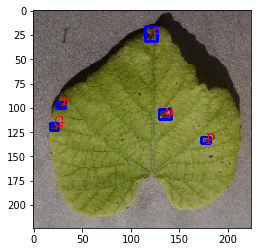

In [101]:
i = train_dataset.__getitem__(4)
img=i[0]
print (i[2])
img = read_image(path_to_image_folder+"/"+label_names_dataset[i[2]]+"/"+img, 224)
img = draw_boxes(img, i[3])
print (i[4])
img = draw_text(img, label_names_dataset[i[2]], i[3])
plt.imshow(img)
plt.show()


In [102]:
def plot_roc_curve(tp, fp,auc_score):
    plt.title('Receiver Operating Characteristic')
    plt.plot(fp, tp, 'b', label = 'AUC = %0.2f' % auc_score)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    
def auroc(predicted_output, ground_truth):
    true_positive_rate, false_positive_rate, _ = roc_curve(ground_truth, predicted_output)
    auc_score=auc(true_positive_rate, false_positive_rate)
    #plot_roc_curve(true_positive_rate, false_positive_rate,auc_score)
    return auc_score
def get_score_bounding_box_eval(model, data_loader):
    model.eval()
    with torch.no_grad():
        predicted_out = np.zeros([0, 1])
        gt = np.zeros([0,1])
        for i in data_loader:
            image = i[1]
            grid = i[4]
            image = image.cuda()
            predicted_output = model(image)
            predicted_out = np.concatenate((predicted_out, predicted_output.view([-1,1]).cpu().numpy()), axis = 0)
            gt = np.concatenate((gt, grid.view([-1,1]).cpu().numpy()), axis = 0)
    return auroc(predicted_out[:,0], gt[:,0])

In [103]:
main_model = models.resnet18(pretrained=True)
print (main_model.fc.in_features)
print (main_model.layer3)

main_model = torch.nn.Sequential(*(list(main_model.children())[:7]))
main_model = torch.nn.Sequential(main_model, torch.nn.Conv2d(in_channels=256, out_channels=1, kernel_size=1))
cuda_main_model = main_model.cuda()
print (cuda_main_model)


512
Sequential(
  (0): BasicBlock(
    (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (downsample): Sequential(
      (0): Conv2d(128, 256, kernel_size=(1, 1), stride=(2, 2), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (1): BasicBlock(
    (conv1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (conv2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(256, eps=1e-05, 

In [104]:
criterion = torch.nn.MultiLabelSoftMarginLoss()
#lr_schedule = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)
#optimizer = torch.optim.SGD(cuda_main_model.parameters(), lr=0.0001, momentum=0.9)
optimizer = torch.optim.Adam(cuda_main_model.parameters(),lr=0.0001)

In [105]:
num_epochs = 40
for epoch in range(num_epochs):
    cuda_main_model.train()
    #lr_schedule.step()
    loss_list = []
    for i in train_loader:
        image_list = i[1]
        grids = i[4]
        image_list = image_list.cuda()
        grids = grids.cuda()
        optimizer.zero_grad()
        predicted_output = cuda_main_model(image_list)
        loss = criterion(predicted_output, grids)
        loss.backward()
        optimizer.step()
        loss_list.append(loss.item())
    print ("epoch:"+str(epoch))
    print ("Loss:")
    print (sum(loss_list)/len(loss_list))
    print (" ")

epoch:0
Loss:
0.5709444745020433
 
epoch:1
Loss:
0.4553907174955715
 
epoch:2
Loss:
0.36720130524852057
 
epoch:3
Loss:
0.3069514821876179
 
epoch:4
Loss:
0.2669112492691387
 
epoch:5
Loss:
0.23761150985956192
 
epoch:6
Loss:
0.21312915195118298
 
epoch:7
Loss:
0.1919302831996571
 
epoch:8
Loss:
0.17452255839651282
 
epoch:9
Loss:
0.1580982729792595
 
epoch:10
Loss:
0.14373246444897217
 
epoch:11
Loss:
0.13036932762373576
 
epoch:12
Loss:
0.11830894378098575
 
epoch:13
Loss:
0.10684688558632677
 
epoch:14
Loss:
0.09623392298817635
 
epoch:15
Loss:
0.08750523051077669
 
epoch:16
Loss:
0.07873729277740825
 
epoch:17
Loss:
0.07074895839799535
 
epoch:18
Loss:
0.06513594040139155
 
epoch:19
Loss:
0.05865047651935707
 
epoch:20
Loss:
0.053127733821218666
 
epoch:21
Loss:
0.048190413381565704
 
epoch:22
Loss:
0.04308515143665401
 
epoch:23
Loss:
0.0398838823153214
 
epoch:24
Loss:
0.036564631048928604
 
epoch:25
Loss:
0.03319891525263136
 
epoch:26
Loss:
0.030793132599104534
 
epoch:27
Loss:

In [106]:
final_auc_score_val = get_score_bounding_box_eval(cuda_main_model, validate_loader)
print (final_auc_score_val)

0.8699388528425435


In [107]:
final_auc_score_test = get_score_bounding_box_eval(cuda_main_model, test_loader)
print (final_auc_score_test)

0.8598021055219349


In [108]:
test_data= torch.utils.data.DataLoader(test_dataset, batch_size = 1, num_workers = 3)

In [109]:
def get_test_set_mistake_image(model, test_set):
    model.eval()
    with torch.no_grad():
        logits_predicted = np.zeros([0,1])
        targets = np.zeros([0,1])
        image_mistake_predicted=[]
        image_mistake_gt=[]
        image_correct = []
        image_correct_gt = []
        count=0
        grid_gt=[]
        for i in test_set:
            image=i[1]
            grid=i[4]
            target=i[2]
#            if count>24:
#                break
            image = image.cuda()
            logit_predicted = model(image)
            out = torch.sigmoid(logit_predicted).data>0.5
            out = out.cpu().numpy()
            grid=grid.cpu().numpy()
            #print ((out==grid).all())
#            count+=1
            if (not(out==grid).all()):
                image=image.squeeze()
                out = torch.from_numpy(out)
                out=out.squeeze(0)
                grid = torch.from_numpy(grid)
                grid = grid.squeeze(0)
                image_mistake_predicted.append((image.cpu(), target,out))
                image_mistake_gt.append((image.cpu(), target,grid))
            else:
                image=image.squeeze()
                out = torch.from_numpy(out)
                out=out.squeeze(0)
                grid = torch.from_numpy(grid)
                grid = grid.squeeze()
                image_correct.append((image.cpu(), target, out))
                image_correct_gt.append((image.cpu(), target,grid))
        return image_mistake_predicted,image_mistake_gt, image_correct, image_correct_gt
image_mistake_predicted,image_mistake_gt, image_correct,  image_correct_gt = get_test_set_mistake_image(cuda_main_model, test_data)

In [110]:
print ("No. of incorrect predictions from the first {} examples of test set:{}".format(str(len(test_data)),str(len(image_mistake_predicted))))

No. of incorrect predictions from the first 88 examples of test set:79


In [111]:
def imresize(grid, img_size, resample):
    return np.array(Image.fromarray(grid).resize(img_size, resample))
def visualize_grids(image_list):
    image = image_list[0].numpy()[0,:,:]
    print('Correct Output: ' + label_names_dataset[image_list[1][0].cpu().numpy()])
    max_val= np.max(image)
    min_val = np.min(image)
    fig, ax = plt.subplots()
    print (image.shape)
    ax.imshow((image-min_val)/(max_val - min_val), cmap='gray')
    ax.imshow(imresize(image_list[2].numpy()[0,:,:], (224, 224), resample  = Image.NEAREST), cmap='jet', alpha=0.3, resample = True)
    plt.show()

The following are the visualizations of the incorrect prediction followed by the same image with ground truth to see the difference:
Correct Output: TomatoBacterialSpot
(224, 224)


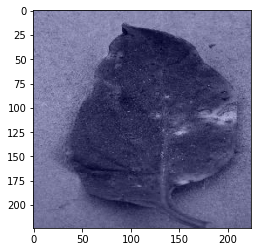

Correct Output: TomatoBacterialSpot
(224, 224)


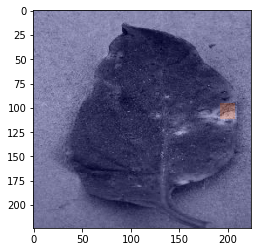

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


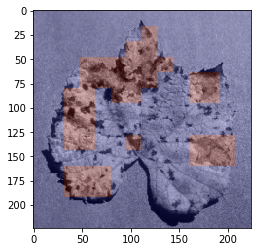

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


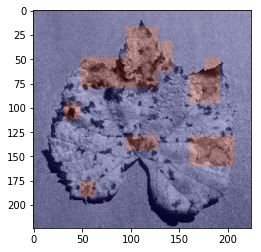

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


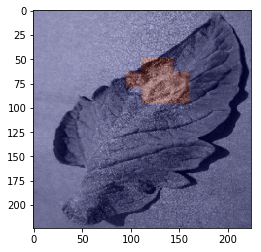

Correct Output: TomatoLateBlight
(224, 224)


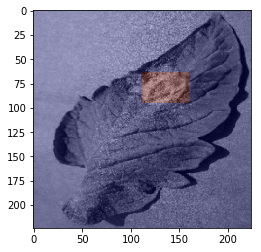

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


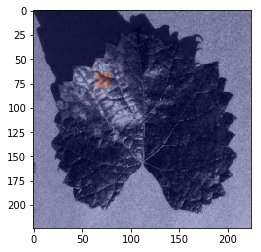

Correct Output: GrapeEscaBlackMeasles
(224, 224)


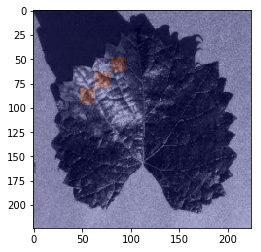

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


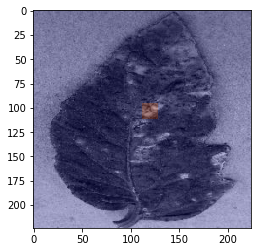

Correct Output: TomatoBacterialSpot
(224, 224)


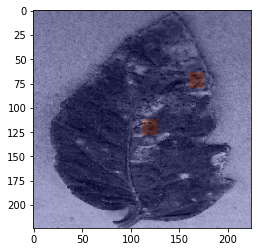

---------------------------------------------------------------------------------------------
Correct Output: TomatoEarlyBlight
(224, 224)


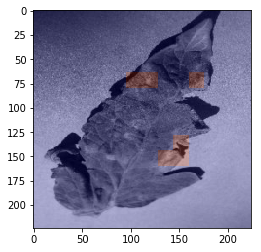

Correct Output: TomatoEarlyBlight
(224, 224)


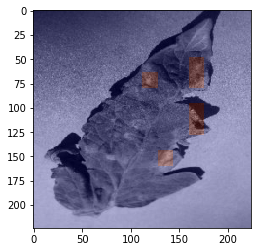

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


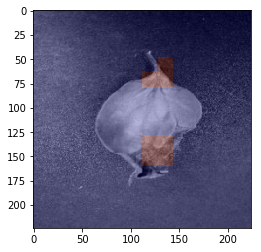

Correct Output: TomatoLateBlight
(224, 224)


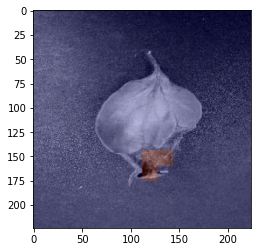

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


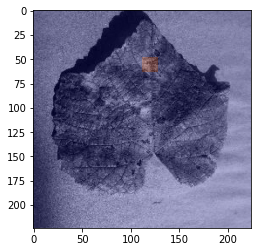

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


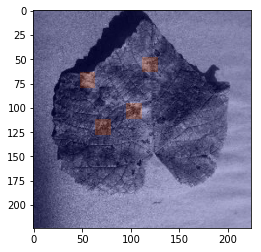

---------------------------------------------------------------------------------------------
Correct Output: CedarAppleRust
(224, 224)


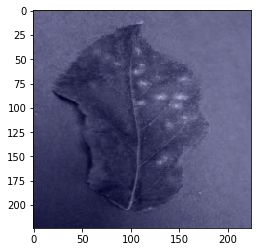

Correct Output: CedarAppleRust
(224, 224)


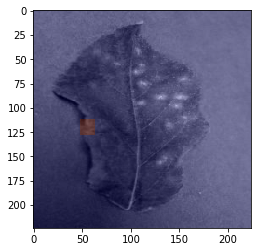

---------------------------------------------------------------------------------------------
Correct Output: AppleScab
(224, 224)


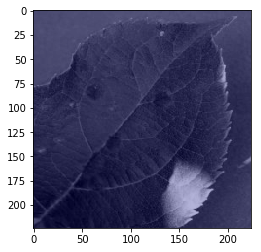

Correct Output: AppleScab
(224, 224)


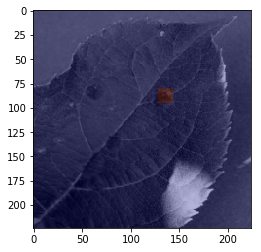

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


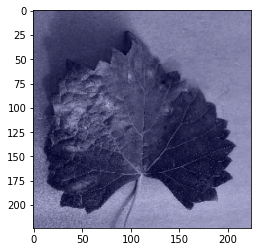

Correct Output: GrapeEscaBlackMeasles
(224, 224)


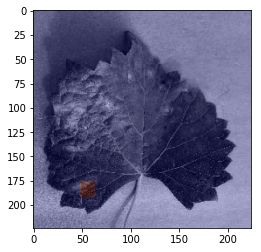

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


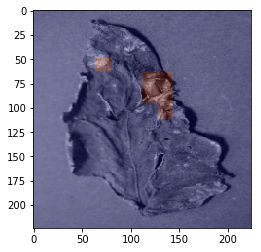

Correct Output: TomatoBacterialSpot
(224, 224)


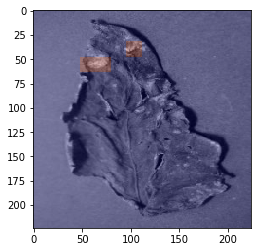

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


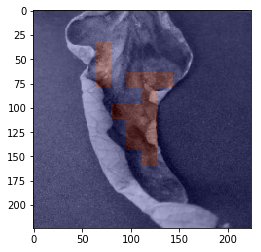

Correct Output: TomatoLateBlight
(224, 224)


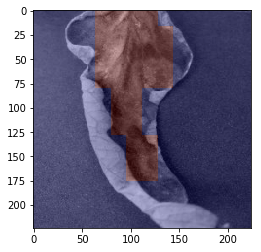

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


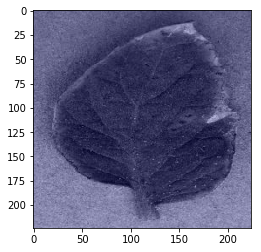

Correct Output: TomatoBacterialSpot
(224, 224)


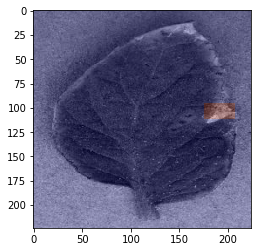

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


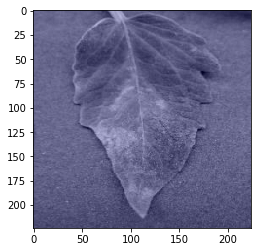

Correct Output: TomatoLateBlight
(224, 224)


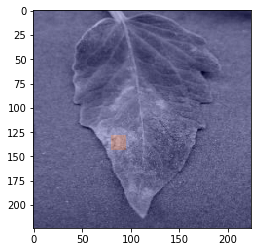

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


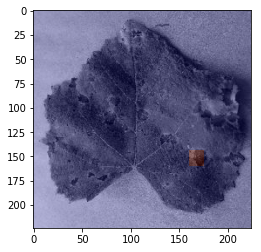

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


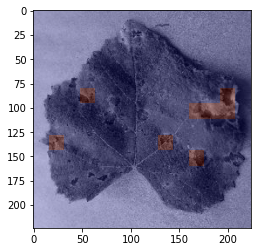

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


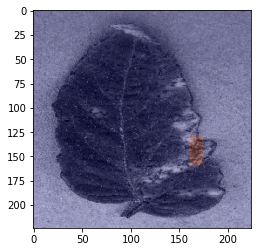

Correct Output: TomatoBacterialSpot
(224, 224)


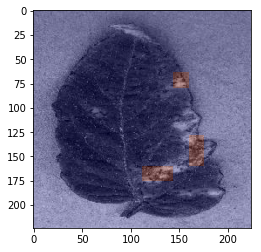

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


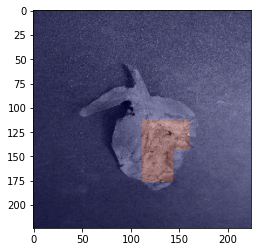

Correct Output: TomatoLateBlight
(224, 224)


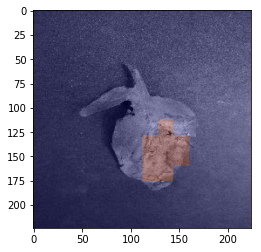

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


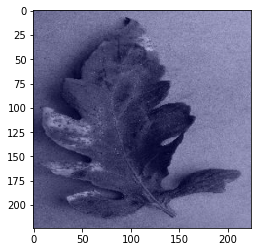

Correct Output: TomatoBacterialSpot
(224, 224)


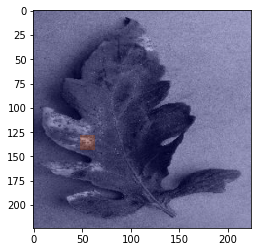

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


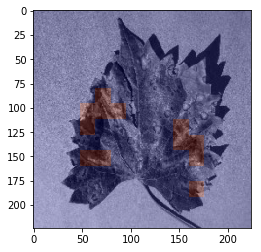

Correct Output: GrapeEscaBlackMeasles
(224, 224)


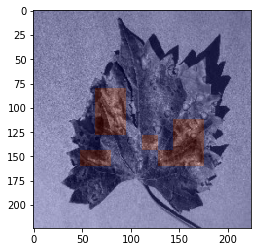

---------------------------------------------------------------------------------------------
Correct Output: TomatoEarlyBlight
(224, 224)


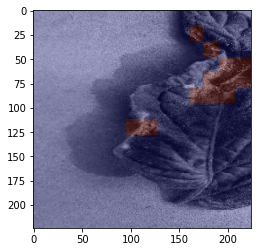

Correct Output: TomatoEarlyBlight
(224, 224)


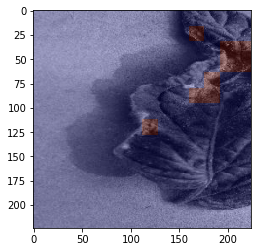

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


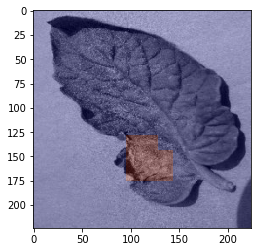

Correct Output: TomatoLateBlight
(224, 224)


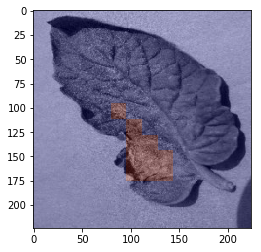

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


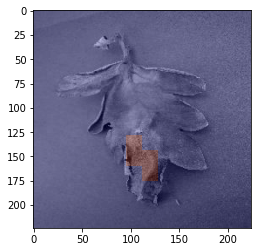

Correct Output: TomatoLateBlight
(224, 224)


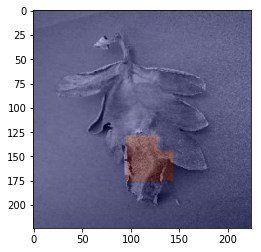

---------------------------------------------------------------------------------------------
Correct Output: AppleScab
(224, 224)


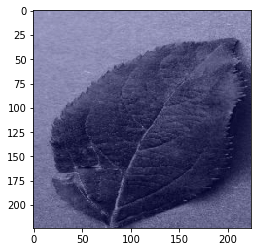

Correct Output: AppleScab
(224, 224)


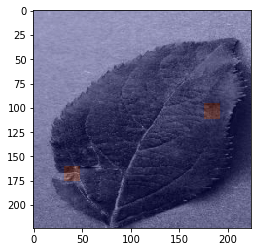

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


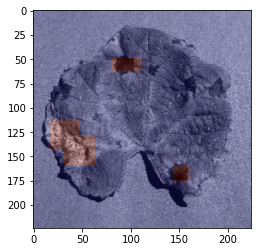

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


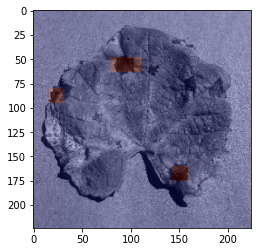

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


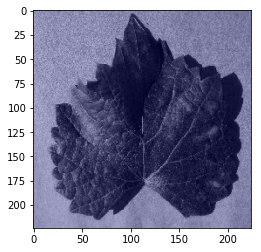

Correct Output: GrapeEscaBlackMeasles
(224, 224)


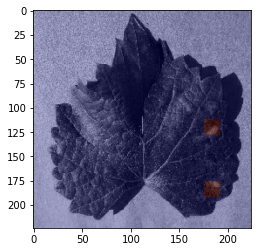

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


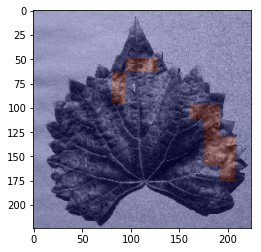

Correct Output: GrapeEscaBlackMeasles
(224, 224)


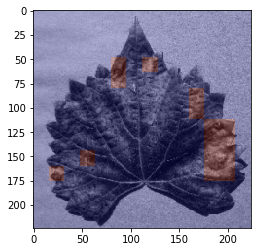

---------------------------------------------------------------------------------------------
Correct Output: TomatoEarlyBlight
(224, 224)


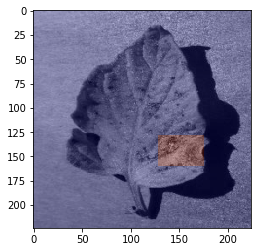

Correct Output: TomatoEarlyBlight
(224, 224)


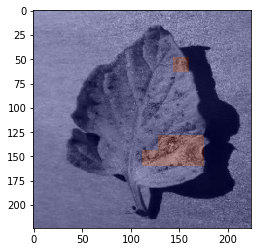

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


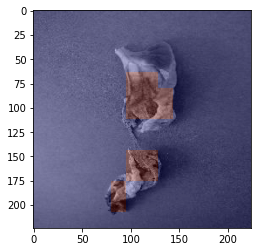

Correct Output: TomatoLateBlight
(224, 224)


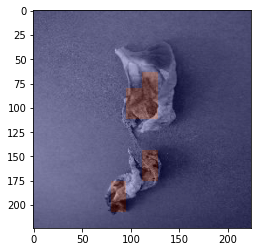

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


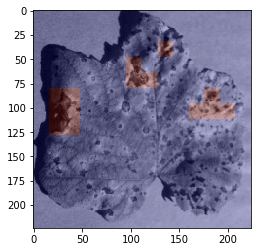

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


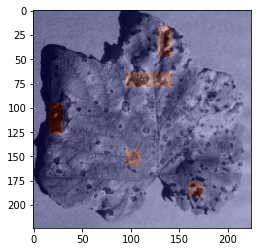

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


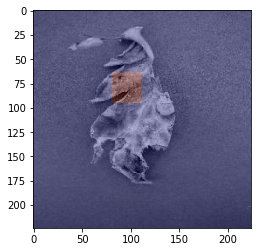

Correct Output: TomatoLateBlight
(224, 224)


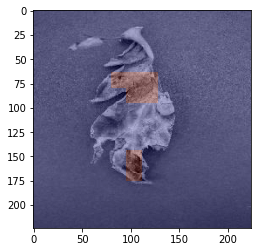

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


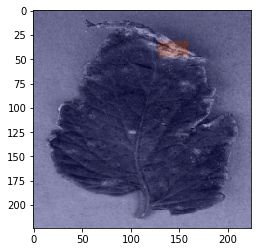

Correct Output: TomatoBacterialSpot
(224, 224)


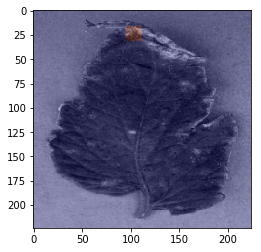

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


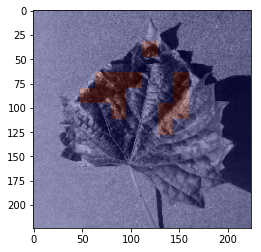

Correct Output: GrapeEscaBlackMeasles
(224, 224)


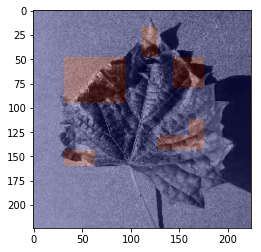

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


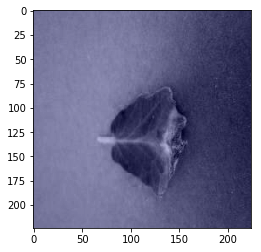

Correct Output: TomatoLateBlight
(224, 224)


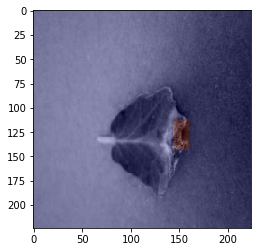

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


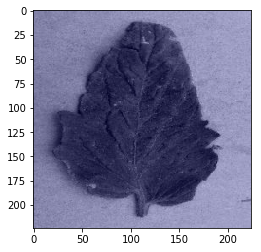

Correct Output: TomatoBacterialSpot
(224, 224)


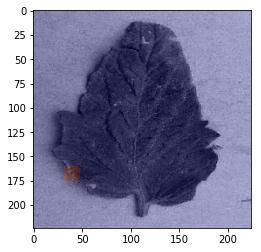

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


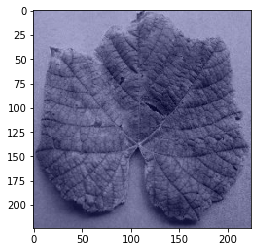

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


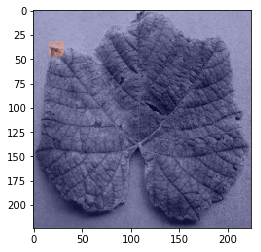

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


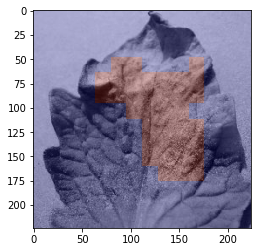

Correct Output: TomatoLateBlight
(224, 224)


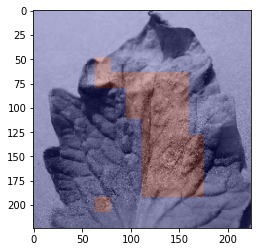

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


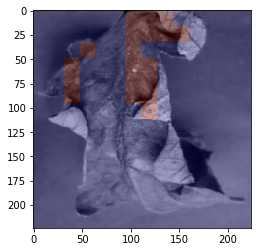

Correct Output: TomatoLateBlight
(224, 224)


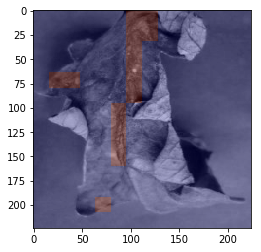

---------------------------------------------------------------------------------------------
Correct Output: AppleScab
(224, 224)


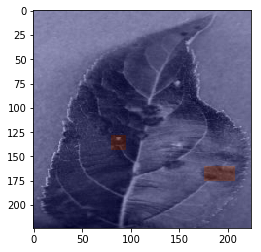

Correct Output: AppleScab
(224, 224)


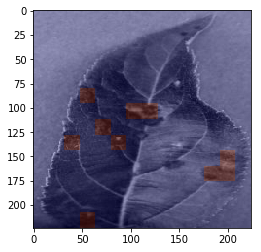

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


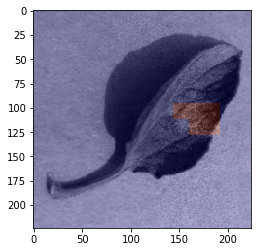

Correct Output: TomatoLateBlight
(224, 224)


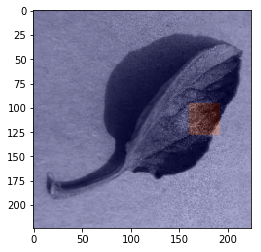

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


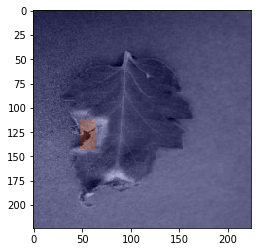

Correct Output: TomatoLateBlight
(224, 224)


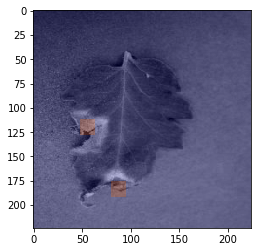

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


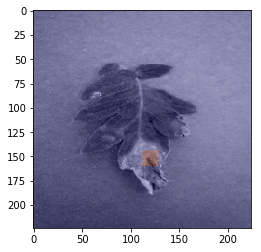

Correct Output: TomatoLateBlight
(224, 224)


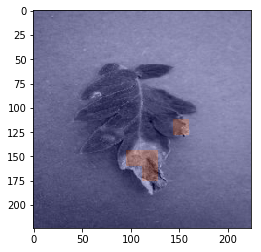

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


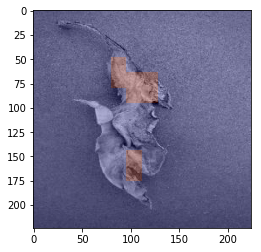

Correct Output: TomatoLateBlight
(224, 224)


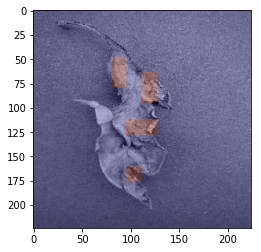

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


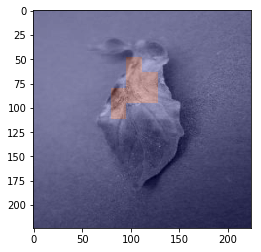

Correct Output: TomatoLateBlight
(224, 224)


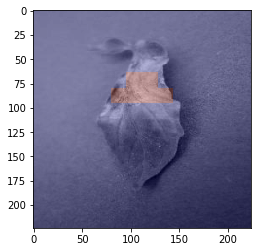

---------------------------------------------------------------------------------------------
Correct Output: TomatoEarlyBlight
(224, 224)


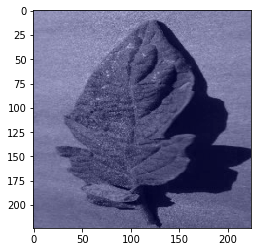

Correct Output: TomatoEarlyBlight
(224, 224)


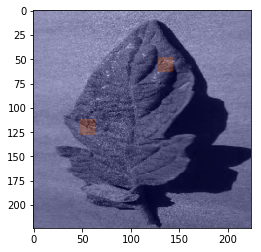

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


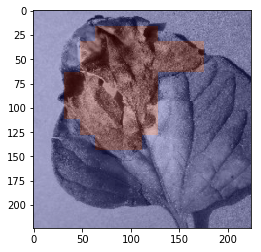

Correct Output: TomatoLateBlight
(224, 224)


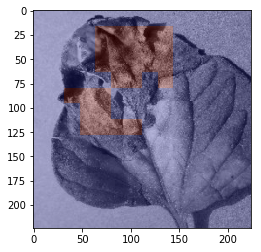

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


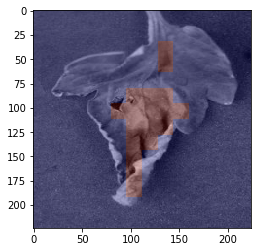

Correct Output: TomatoLateBlight
(224, 224)


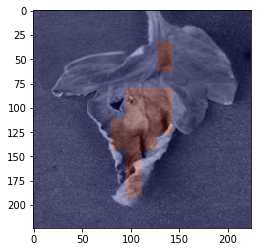

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


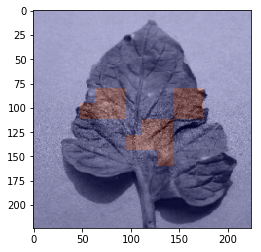

Correct Output: TomatoLateBlight
(224, 224)


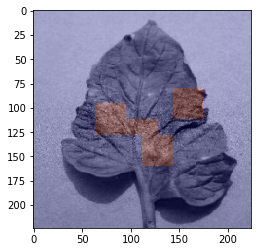

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


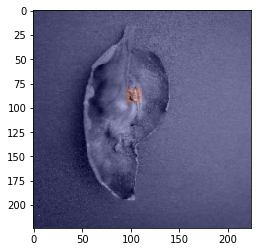

Correct Output: TomatoLateBlight
(224, 224)


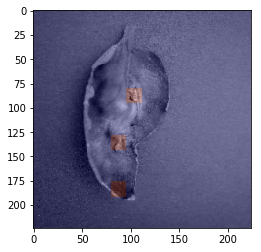

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


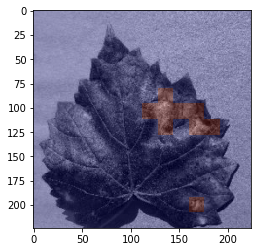

Correct Output: GrapeEscaBlackMeasles
(224, 224)


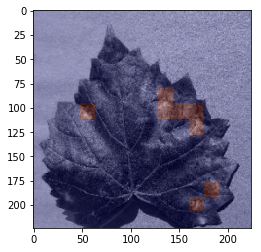

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


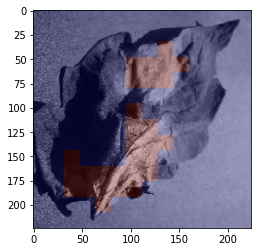

Correct Output: TomatoLateBlight
(224, 224)


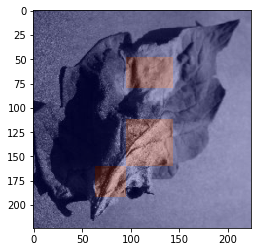

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


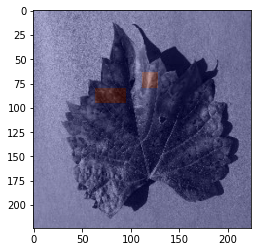

Correct Output: GrapeEscaBlackMeasles
(224, 224)


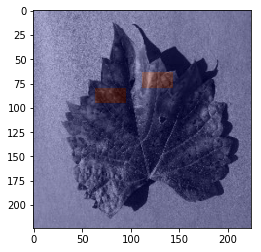

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


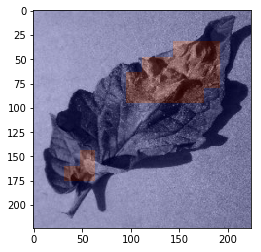

Correct Output: TomatoLateBlight
(224, 224)


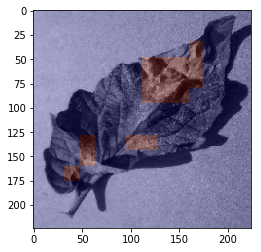

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


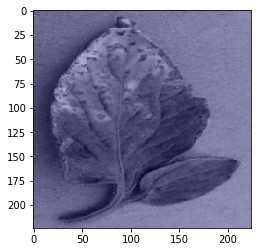

Correct Output: TomatoBacterialSpot
(224, 224)


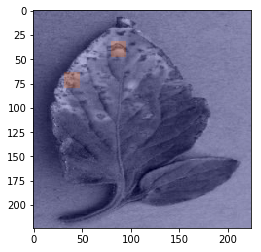

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


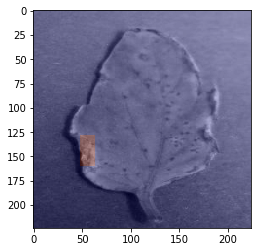

Correct Output: TomatoBacterialSpot
(224, 224)


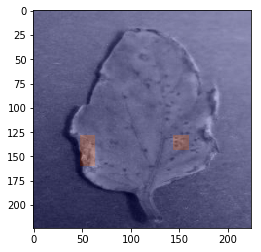

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


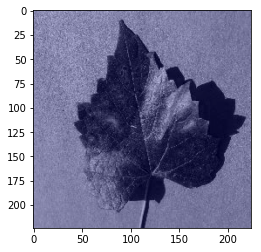

Correct Output: GrapeEscaBlackMeasles
(224, 224)


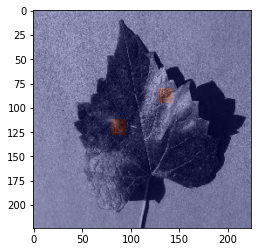

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


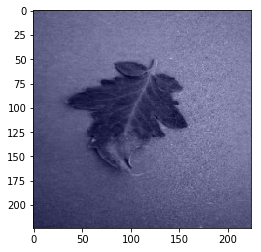

Correct Output: TomatoLateBlight
(224, 224)


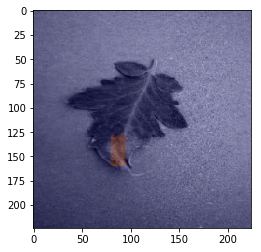

---------------------------------------------------------------------------------------------
Correct Output: AppleScab
(224, 224)


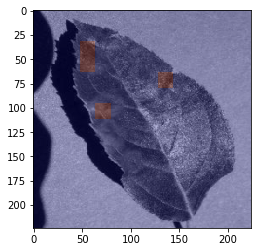

Correct Output: AppleScab
(224, 224)


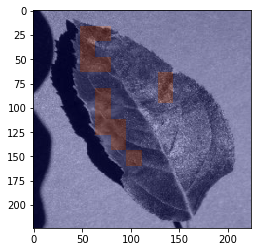

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


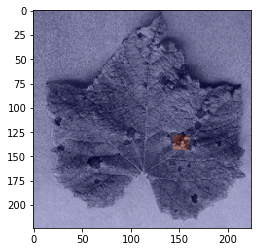

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


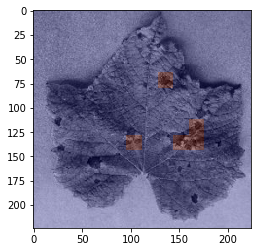

---------------------------------------------------------------------------------------------
Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


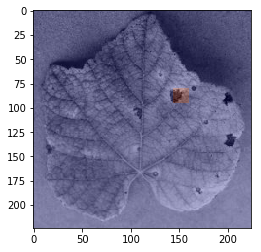

Correct Output: GrapeLeafBlightIsariopsis
(224, 224)


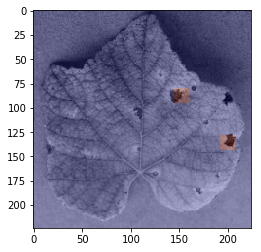

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


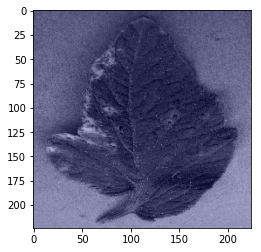

Correct Output: TomatoBacterialSpot
(224, 224)


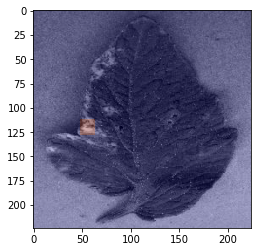

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


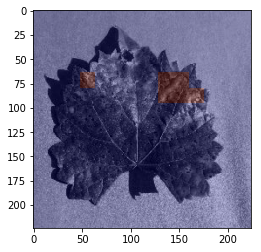

Correct Output: GrapeEscaBlackMeasles
(224, 224)


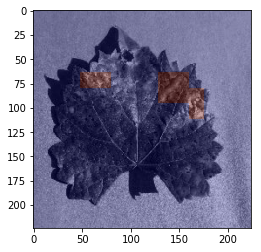

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


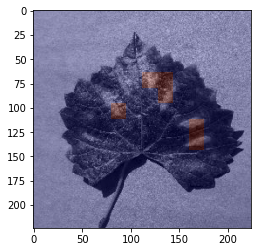

Correct Output: GrapeEscaBlackMeasles
(224, 224)


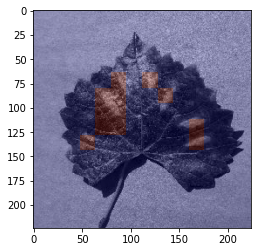

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


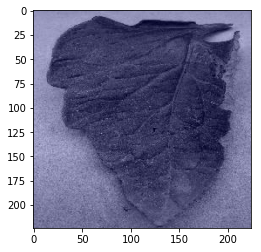

Correct Output: TomatoBacterialSpot
(224, 224)


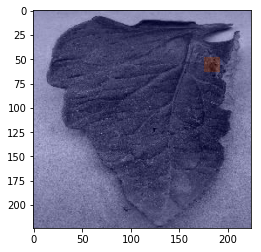

---------------------------------------------------------------------------------------------
Correct Output: AppleScab
(224, 224)


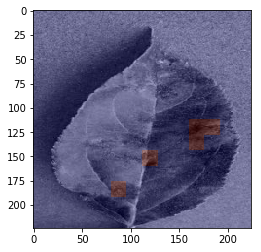

Correct Output: AppleScab
(224, 224)


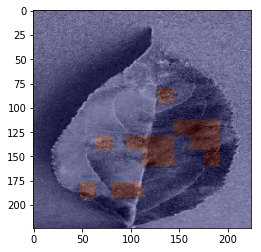

---------------------------------------------------------------------------------------------
Correct Output: TomatoLateBlight
(224, 224)


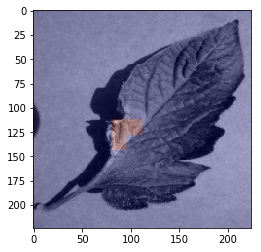

Correct Output: TomatoLateBlight
(224, 224)


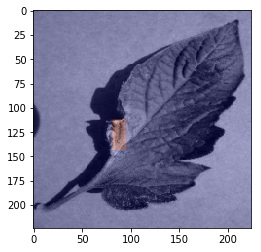

---------------------------------------------------------------------------------------------
Correct Output: TomatoBacterialSpot
(224, 224)


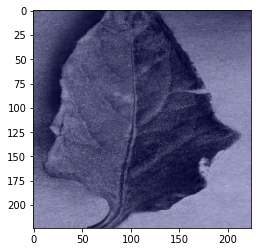

Correct Output: TomatoBacterialSpot
(224, 224)


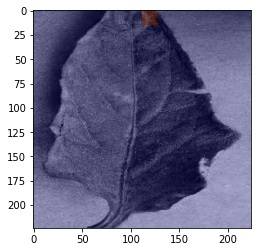

---------------------------------------------------------------------------------------------
Correct Output: GrapeEscaBlackMeasles
(224, 224)


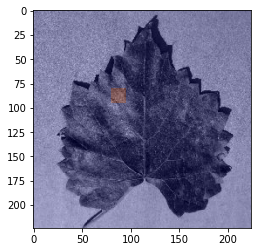

Correct Output: GrapeEscaBlackMeasles
(224, 224)


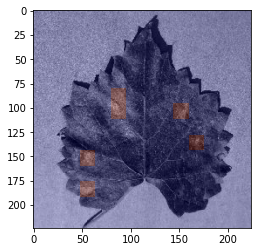

---------------------------------------------------------------------------------------------


In [57]:
print ("The following are the visualizations of the incorrect prediction followed by the same image with ground truth to see the difference:")
for i in range(len(image_mistake_predicted)):
    visualize_grids(image_mistake_predicted[i])
    visualize_grids(image_mistake_gt[i])

    print ("---------------------------------------------------------------------------------------------")